**German Powergrid**

bharambe.vinay3011@gmail.com

roshnijharbade890@gmail.com

anil.kandel3227@gmail.com

dhillonaman777777@gmail.com

import networkx as nx 
import numpy as np 
import matplotlib.pyplot as plt
import math
import plotly.graph_objects as go

In [2]:
#importing clean data

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
                
#types numbering
#substation=1, plant=2, generator=3, auxillary_t_node=4

In [3]:
#adding nodes
G=nx.Graph()
        
for i in range(0,len(x),1):
    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')


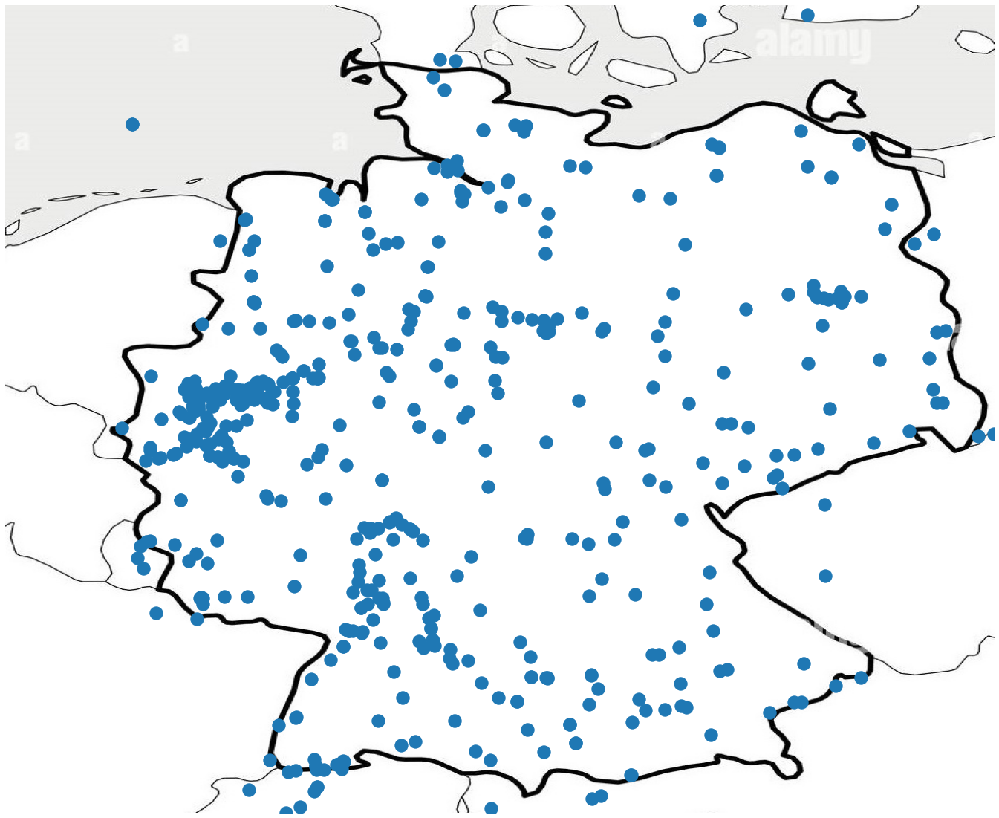

In [4]:
plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])

nx.draw(G,pos)

Theoretics of the Graph : Roshni Jharbade

In [5]:
from networkx.algorithms import community

In [6]:
import cdlib
from cdlib import algorithms
from cdlib import evaluation
from cdlib import NodeClustering
from collections import defaultdict

Note: to be able to use all crisp methods, you need to install some additional packages:  {'graph_tool', 'wurlitzer', 'infomap', 'leidenalg', 'karateclub'}
Note: to be able to use all overlapping methods, you need to install some additional packages:  {'karateclub', 'ASLPAw'}
Note: to be able to use all bipartite methods, you need to install some additional packages:  {'wurlitzer', 'leidenalg', 'infomap'}


In [7]:
#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
for i in range(0,len(p),1):
    weight_edge.append(math.ceil(1+0.1*cables[i]+(0.02*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])



In [8]:
#Number of nodes and links

len(G.nodes())

511

In [9]:
len(G.edges())

679

In [10]:
# Is is an Undirected graph, since if one station is connected with other then obviously second is connected to first.

#Eg. Friends network

In [11]:
#Average Clustering

from networkx.algorithms.cluster import average_clustering
average_clustering(G)

0.1357633777398944

In [12]:
degs_centrality=[]
c= [50, 54, 82, 84, 91, 115, 121, 138, 142, 143, 166, 188, 202, 205, 206, 210, 217, 248, 249, 250, 251, 252, 257, 291, 293, 296, 310, 365, 368, 410, 423, 497, 507]
k=[]
degs_centrality=list(nx.degree_centrality(G).values())
for i in c:
    k.append(degs_centrality[i])

In [13]:
k

[0.0058823529411764705,
 0.00196078431372549,
 0.0058823529411764705,
 0.0058823529411764705,
 0.00196078431372549,
 0.0058823529411764705,
 0.00196078431372549,
 0.011764705882352941,
 0.00980392156862745,
 0.00392156862745098,
 0.00196078431372549,
 0.00980392156862745,
 0.00196078431372549,
 0.0058823529411764705,
 0.00392156862745098,
 0.00392156862745098,
 0.00980392156862745,
 0.00392156862745098,
 0.00392156862745098,
 0.00196078431372549,
 0.00784313725490196,
 0.00196078431372549,
 0.00392156862745098,
 0.00980392156862745,
 0.00784313725490196,
 0.00392156862745098,
 0.00196078431372549,
 0.00196078431372549,
 0.00196078431372549,
 0.00196078431372549,
 0.00196078431372549,
 0.00196078431372549,
 0.00196078431372549]

In [14]:
degs_centrality[14]

0.00980392156862745

In [15]:
c[11]

188

In [16]:
138,

(138,)

In [17]:
#Number of Connected components

nx.number_connected_components(G)

4

In [18]:
degs_centrality=[]

degs_centrality=list(nx.degree_centrality(G).values())
np.argsort(degs_centrality)[-5:]

degs_centrality.sort(reverse=True)
degs_centrality

[0.029411764705882353,
 0.027450980392156862,
 0.025490196078431372,
 0.023529411764705882,
 0.021568627450980392,
 0.021568627450980392,
 0.0196078431372549,
 0.0196078431372549,
 0.0196078431372549,
 0.0196078431372549,
 0.01764705882352941,
 0.01764705882352941,
 0.01764705882352941,
 0.01568627450980392,
 0.01568627450980392,
 0.01568627450980392,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.013725490196078431,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0.011764705882352941,
 0

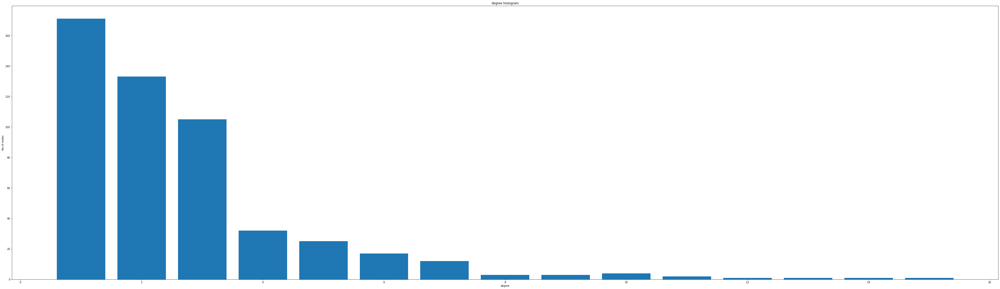

In [19]:
degree_sequence=sorted((d for n,d in G.degree()),reverse=True)

degree_sequence_unique=np.unique(degree_sequence,return_counts=True)

plt.bar(degree_sequence_unique[0],degree_sequence_unique[1])
plt.title("degree histogram")
plt.xlabel("degree")
plt.ylabel("No of nodes")
plt.show()

In [20]:
communities_greedy_mod = community.greedy_modularity_communities(G)
print("Number of communities:", len(communities_greedy_mod))

Number of communities: 19


In [21]:
close_centrality=[]

close_centrality=list(nx.closeness_centrality(G).values())
close_centrality.sort(reverse=True)
close_centrality

[0.1313477289650037,
 0.1288669051061563,
 0.12784152675443894,
 0.1265423242467719,
 0.12356005662001839,
 0.12270770836050608,
 0.12189686447266132,
 0.1211261158159762,
 0.12053983258356586,
 0.12039414750671844,
 0.11987258441282651,
 0.11895643377962602,
 0.11844722669091419,
 0.11716551122919176,
 0.11700037308792438,
 0.11626297577854672,
 0.11618161610340429,
 0.11618161610340429,
 0.11607331350158336,
 0.1159652126275423,
 0.11484219235307681,
 0.11402714932126698,
 0.11381869018173998,
 0.11376669443474055,
 0.11368878982773206,
 0.11363691267061239,
 0.11350742667167141,
 0.11327509398119039,
 0.11306937303865927,
 0.11253289386247044,
 0.11220333143394777,
 0.11220333143394777,
 0.11220333143394777,
 0.11212755250681994,
 0.11195113244218793,
 0.1115249861700166,
 0.11122612510837296,
 0.11102777267839815,
 0.11097829506134005,
 0.11014387179020214,
 0.1099250912017864,
 0.1097555284784694,
 0.10951420145894769,
 0.1094660633484163,
 0.1094660633484163,
 0.1093459030154323,

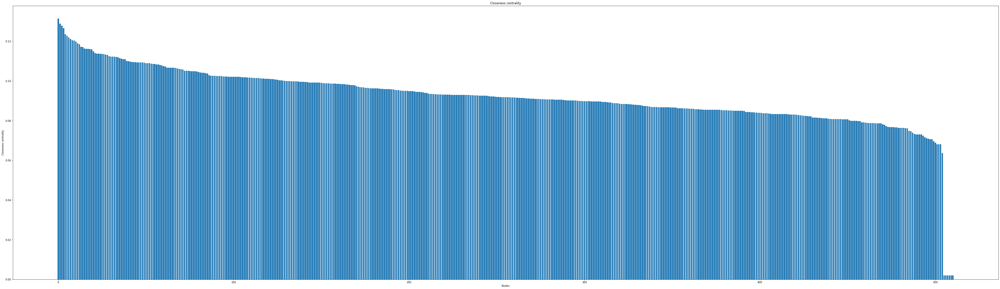

In [22]:

s=[]
for i in range(0,len(close_centrality)):
    s.append(i)
plt.bar(s,close_centrality)
plt.title("Closeness centrality")
plt.xlabel("Nodes")
plt.ylabel("Closeness centrality")
plt.show()

In [23]:
ev_centrality=[]

ev_centrality=list(nx.eigenvector_centrality(G,max_iter=1000).values())
ev_centrality.sort(reverse=True)
ev_centrality

[0.4627860071775781,
 0.43269976204536004,
 0.27723940489082854,
 0.21658565003870703,
 0.19806256683374923,
 0.19077558291168267,
 0.17682399488278486,
 0.17339566628525863,
 0.17339566628525863,
 0.16609455651207344,
 0.16470262750438738,
 0.16364307265959285,
 0.15205636857106924,
 0.1336809929901,
 0.12756803863686358,
 0.12053870841475448,
 0.11631206330212603,
 0.104216055217736,
 0.09859253968059178,
 0.09818851302954046,
 0.09218304323109087,
 0.08833742336103353,
 0.08833742336103353,
 0.07388086632964933,
 0.07137367987049749,
 0.07136952915265365,
 0.059063456473700385,
 0.05846618457012197,
 0.05784922254252398,
 0.057813770394360184,
 0.049430490785034926,
 0.04833571816230378,
 0.04614190463704206,
 0.04614190463704206,
 0.04614190463704206,
 0.044097371121460116,
 0.044097371121460116,
 0.04283573610893469,
 0.04283573610893469,
 0.042526352619381785,
 0.042195518723991486,
 0.042195518723991486,
 0.042195518723991486,
 0.04188594168005422,
 0.03891767306958294,
 0.03889

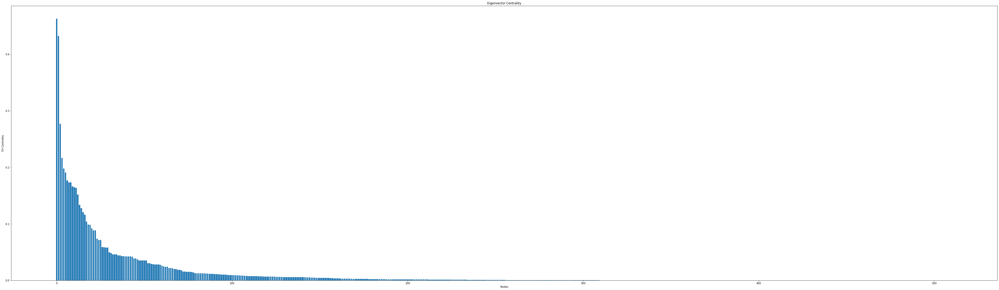

In [24]:

s=[]
for i in range(0,len(ev_centrality)):
    s.append(i)
plt.bar(s,ev_centrality)
plt.title("Eigenvector Centrality")
plt.xlabel("Nodes")
plt.ylabel("EV Centrality")
plt.show()

In [25]:
btw_centrality=[]

btw_centrality=list(nx.betweenness_centrality(G).values())
btw_centrality.sort(reverse=True)
btw_centrality


[0.39676191359861523,
 0.2924994738953699,
 0.27947390009637874,
 0.2751196557254835,
 0.26214290854728645,
 0.24397902728213053,
 0.2221931600293115,
 0.2062754690952068,
 0.20184843646348036,
 0.19609823646509147,
 0.1766143763056658,
 0.1679919519656531,
 0.16007042441462352,
 0.15708674275214815,
 0.1453520824531336,
 0.14264117932704085,
 0.14061485774102897,
 0.11989895694391772,
 0.11672874481488517,
 0.10662162335647123,
 0.10237432223884319,
 0.09964212916514997,
 0.09910564214073972,
 0.0979258144648967,
 0.0968488731038644,
 0.09628267598582743,
 0.09202023823457982,
 0.09069732148134697,
 0.0901637209059719,
 0.0878085759918698,
 0.08665721693160452,
 0.08631201397005649,
 0.07984018939127538,
 0.0783893899295856,
 0.07684237404499458,
 0.07658510354734507,
 0.07618158048875723,
 0.07465891287804415,
 0.07418771314761144,
 0.07092742446498525,
 0.06875142266220942,
 0.06742868906156509,
 0.0645096823423551,
 0.06358694867126015,
 0.06326893908174752,
 0.061054085013697114,


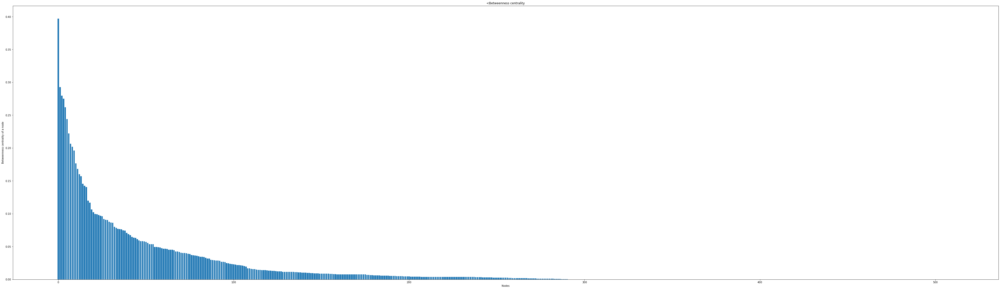

In [26]:

s=[]
for i in range(0,len(btw_centrality)):
    s.append(i)
plt.bar(s,btw_centrality)
plt.title("<Betweenness centrality")
plt.xlabel("Nodes")
plt.ylabel("Betweenness centrality of a node")
plt.show()

Graph characteristics and First attack algorithm : Anil Kandel

In [27]:
#Adding nodesizes

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

In [28]:
degs[1]

5

In [29]:
#Normal color coding using degrees as reference

#degree < 5 ==> blue
#5 <degree <10 ==> orange
#degree > 10 ==> red

color=["#0f03fc"]*511 # Generate a list of size 511 with each value as string red
for i in range(len(x)):
    if degs[i]<5:
        color[i]="#2403fc"
    elif degs[i]>5 and degs[i]<10:
        color[i]="#fc7b03"
    else:
        color[i]="#fc0f03"


In [30]:
#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*511
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

In [1]:
plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])

nx.draw(G,pos,node_color=color,node_size=nodesize,width=weight_edge)
#nx.draw(G,pos,node_color=color,width=weight_edge,node_size=nodesize)

NameError: name 'plt' is not defined

*Plotly Visualization*

In [28]:
#Plotly edges

edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = G.nodes[edge[0]]['pos']
    x1, y1 = G.nodes[edge[1]]['pos']
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=1, color='#000000'),
    hoverinfo='none',
    mode='lines')

node_x = []
node_y = []
for node in G.nodes():
    x, y = G.nodes[node]['pos']
    node_x.append(x)
    node_y.append(y)



In [29]:
#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(12*math.log10(7*deg))

In [30]:
node_trace = go.Scatter(x=node_x, y=node_y,mode='markers',hoverinfo='text',marker=dict(color=color,size=nodesize,opacity=1),
        line_width=2)

node_text = []

for i in range (0,len(v)):
    node_text.append('Node No:'+str(int(v[i]))+'\n Degree:'+str(int(degs[i])))
    
node_trace.text = node_text


In [31]:
fig = go.Figure(data=[edge_trace, node_trace],layout=go.Layout(title='<br>Network graph made with Python',titlefont_size=16,
                showlegend=False,hovermode='closest',margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(text="Recommended",showarrow=False,xref="paper", yref="paper",x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

In [32]:

# update layout properties
fig.update_layout(autosize=False,height=900,width=1100,hovermode="x",margin=dict(r=50, l=300, b=75, t=125),title=(""),
    images= [dict(source='1.jpg',xref="paper", yref="paper",
                    x=0, y=1,  #position of the upper left corner of the image in subplot 1,1
                    sizex=1, sizey=1, #sizex, sizey are set by trial and error
                    xanchor="left",yanchor="top",sizing="stretch",layer="below")])
fig.update_xaxes(showgrid=False, zeroline=False)
fig.update_yaxes(showgrid=False, zeroline=False)
fig.show()



Attack strategy It can be done in two ways
 
1. Attacking the nodes with maximum degrees
2. Attacking a powerplant or generator so that the power supply to the substations can be cut off.
3. Attacking an individual link

1. Attacking the node with maximum degree:
    In this attack we'll we able to cutoff interconnectivity of maximum number of substations with each other.
    
To do this,
    we'll search out data for the node with maximum number if degree
    
After that we'll change the color of that node in first attempt
                ,change the color of the links involved with it
    and then delete the node to see the effect on the network.
    
finally, we'll choose to attack on one or more nodes which will take down most of the network.

a. Highlighting nodes with maximum degrees

In [32]:
min = input("Enter Minimum degress: ")

Enter Minimum degress: 7


In [33]:
min_degs_nodes=[]

for i in range(0,len(degs)):
    if(degs[i]>int(min)):
        min_degs_nodes.append(i)
        
attack_nodes=[]
for i in min_degs_nodes:
    attack_nodes.append(v[i])

In [34]:

#or do it with degs_centrality

#degs_centrality=[]

#degs_centrality=list(nx.degree_centrality(G).values())



#min_between=[]

#for i in range(0,len(degs_centrality)):
#    if(degs_centrality[i]>float(min)):
#        min_between.append(i)

#attack_nodes=[]
#for j in min_between:
#    attack_nodes.append(v[j])

In [35]:
attack_nodes

[5.0,
 32.0,
 37.0,
 42.0,
 52.0,
 69.0,
 86.0,
 87.0,
 105.0,
 110.0,
 117.0,
 123.0,
 125.0,
 165.0,
 279.0,
 362.0]

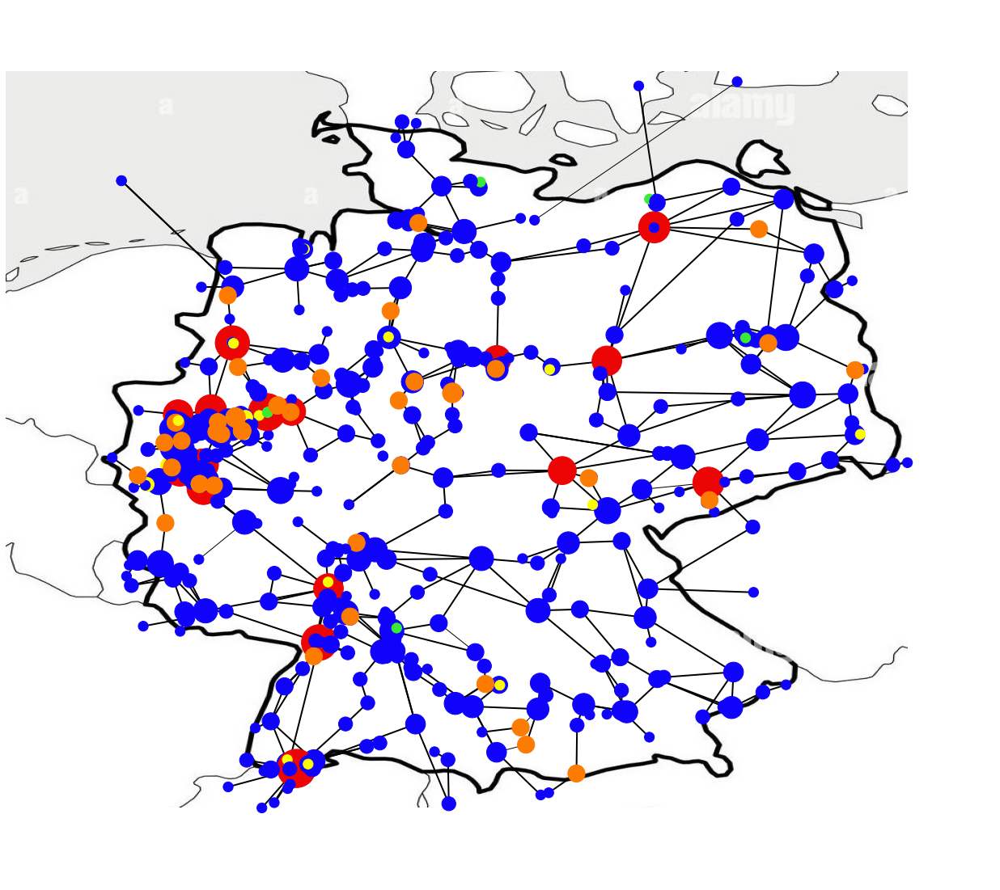

In [36]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 
#Highlighting the attack nodes

b=[]
for i in range(0,len(x)):
    for j in attack_nodes:
        if v[i]==j :
            b.append(i)
            
#identifying the affected links

a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

#adding nodes
G=nx.Graph()

for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    

pos=nx.get_node_attributes(G,'pos')



#edge coloring for the links associated with the node that is being attacked
ecolor=color=["#eb34cf"]*len(p)
for i in range(0,len(cables),1):

    ecolor[i]="000000"
    weight_edge.append(math.ceil(1+0.1*cables[i]+(0.02*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i],color=ecolor[i])

    
for j in a:
    ecolor[j]="#eb0505"
    weight_edge.append(math.ceil(1+0.1*cables[j]+(0.02*wires[j])))
    G.add_edge(p[j],q[j],color=ecolor[j],weight=weight_edge[j])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)
    
#Normal color coding using degrees as reference

#degree < 5 ==> blue
#5 <degree <10 ==> orange
#degree > 10 ==> red

color=["#0f03fc"]*len(x) # Generate a list of size 511 with each value as string red
for i in range(0,len(x),1):
    if degs[i]<5:
        color[i]="#2403fc"
    elif degs[i]>5 and degs[i]<10:
        color[i]="#fc7b03"
    else:
        color[i]="#fc0f03"

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
for j in b:
    color[j]="#eb0505"
  
#Red : Attacked nodes


plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize,width=weight_edge)

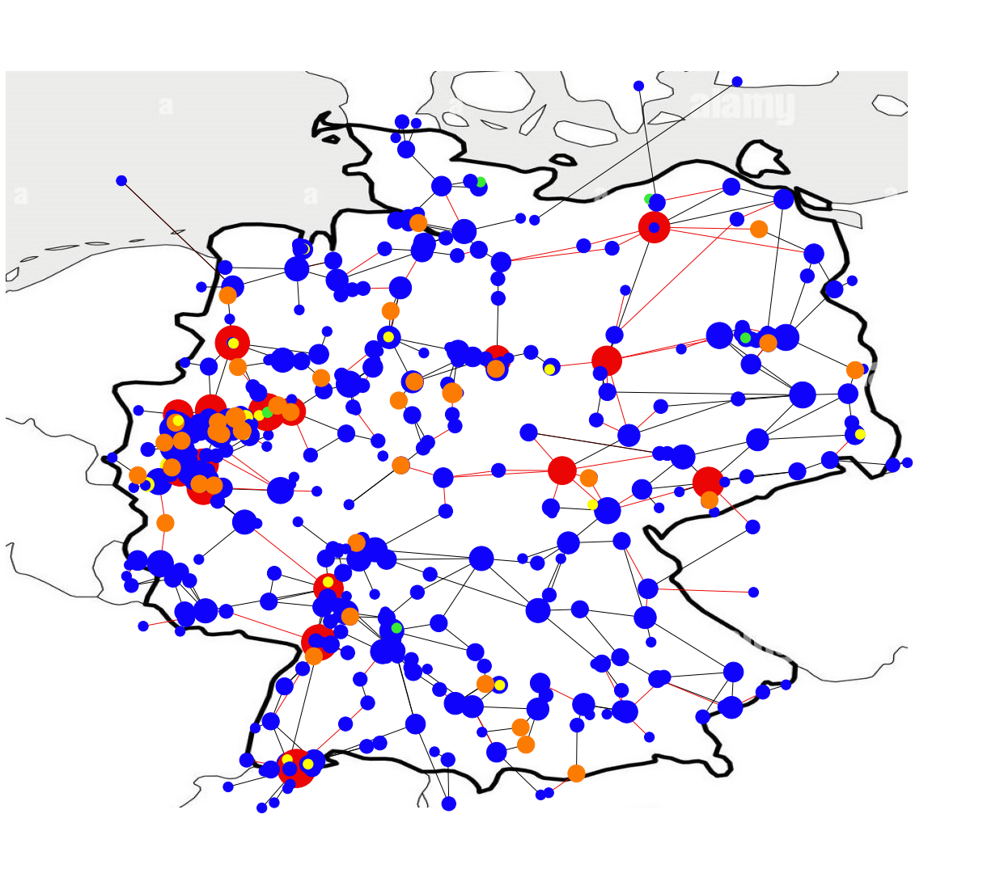

In [37]:
#Red links : affected network

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,edge_color=ecolor,node_size=nodesize)

b. Attacking nodes

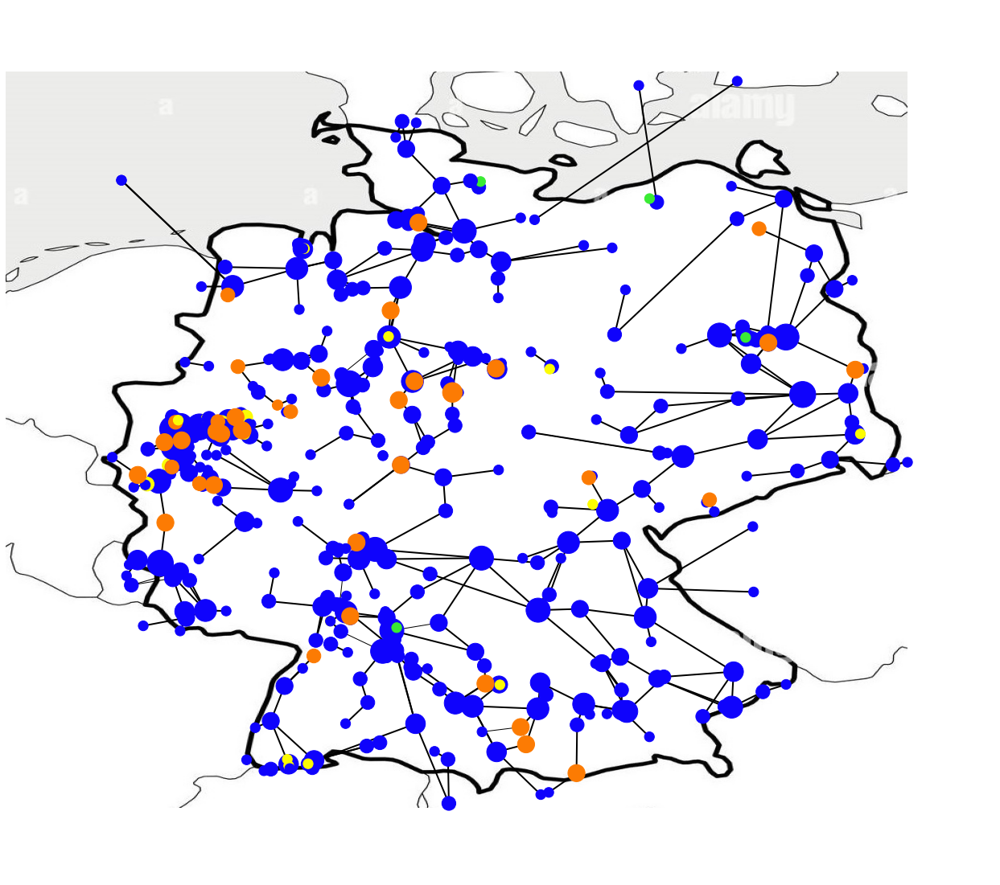

In [38]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)

a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))
    
#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
for i in range(0,len(p),1):
    weight_edge.append(math.ceil(1+0.1*cables[i]+(0.02*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])


degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize,width=weight_edge)

In [39]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(attack_nodes)))+" out of 511")
print("Percentage Damage:"+str(100-(len(G.edges)*100/679)))


Number of Edges:511
Number of Nodes attacked:16 out of 511
Percentage Damage:24.74226804123711


Betweenness centrality attack

In [28]:
btw_centrality=[]

btw_centrality=list(nx.betweenness_centrality(G).values())


In [29]:
min = input("Enter Minimum betweenness centrality: ")

Enter Minimum betweenness centrality: 0.12


In [30]:
min_between=[]

for i in range(0,len(btw_centrality)):
    if(btw_centrality[i]>float(min)):
        min_between.append(i)

attack_nodes=[]
for j in min_between:
    attack_nodes.append(v[j])

In [31]:
attack_nodes

[31.0,
 32.0,
 37.0,
 68.0,
 69.0,
 72.0,
 86.0,
 87.0,
 107.0,
 117.0,
 123.0,
 125.0,
 147.0,
 216.0,
 246.0,
 304.0,
 496.0]

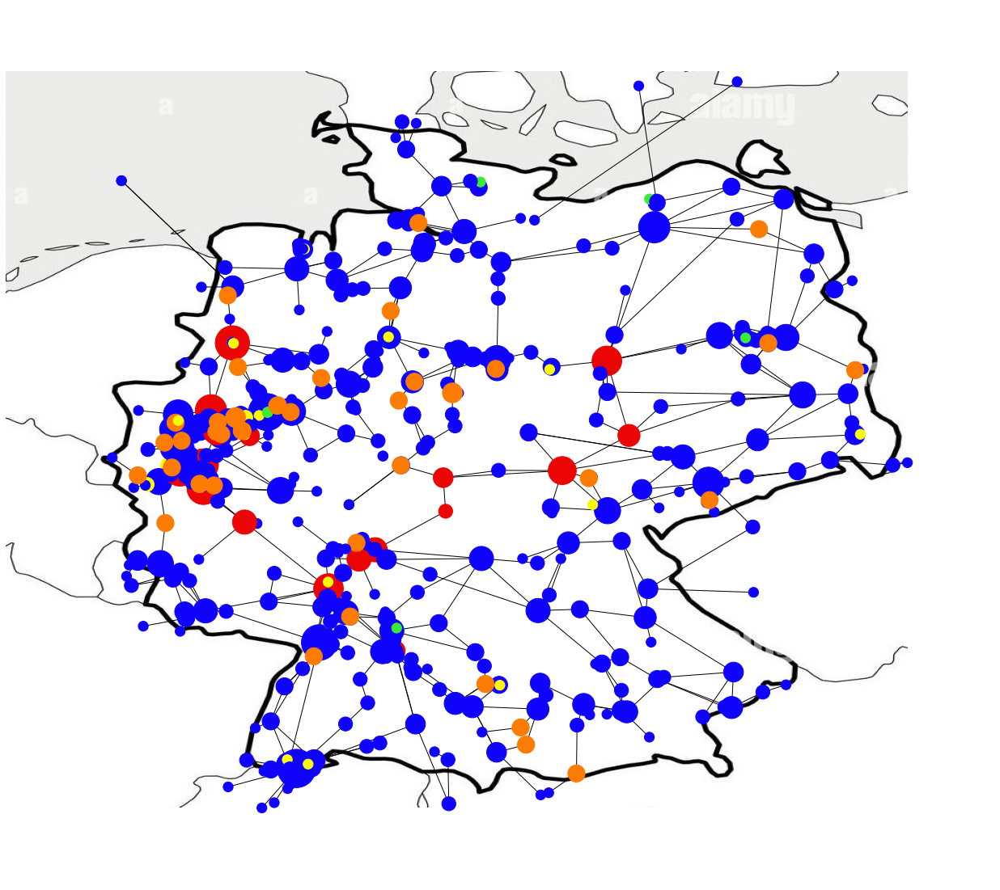

In [32]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)

#Highlighting the attack nodes

b=[]
for i in range(0,len(x)):
    for j in attack_nodes:
        if v[i]==j :
            b.append(i)

#identifying the affected links

a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

#adding nodes
G=nx.Graph()

for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    

pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []

#edge coloring for the links associated with the node that is being attacked
ecolor=color=["#eb34cf"]*len(p)
for i in range(0,len(cables),1):

    ecolor[i]="000000"
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i],color=ecolor[i])

    
for j in a:
    ecolor[j]="#eb0505"
    weight_edge.append(math.ceil(1+cables[j]+(0.2*wires[j])))
    G.add_edge(p[j],q[j],color=ecolor[j],weight=weight_edge[j])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
for j in b:
    color[j]="#eb0505"
  
#Red : Attacked nodes


plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)


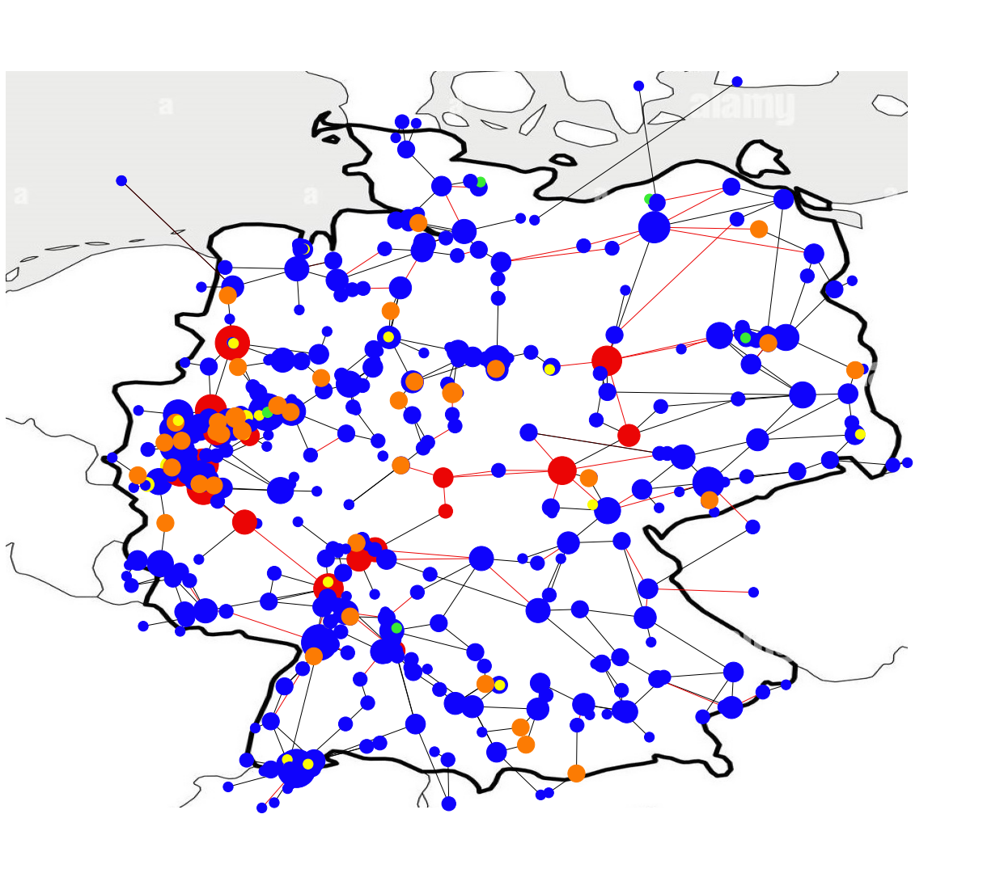

In [33]:
#Red links : affected network

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,edge_color=ecolor,node_size=nodesize)

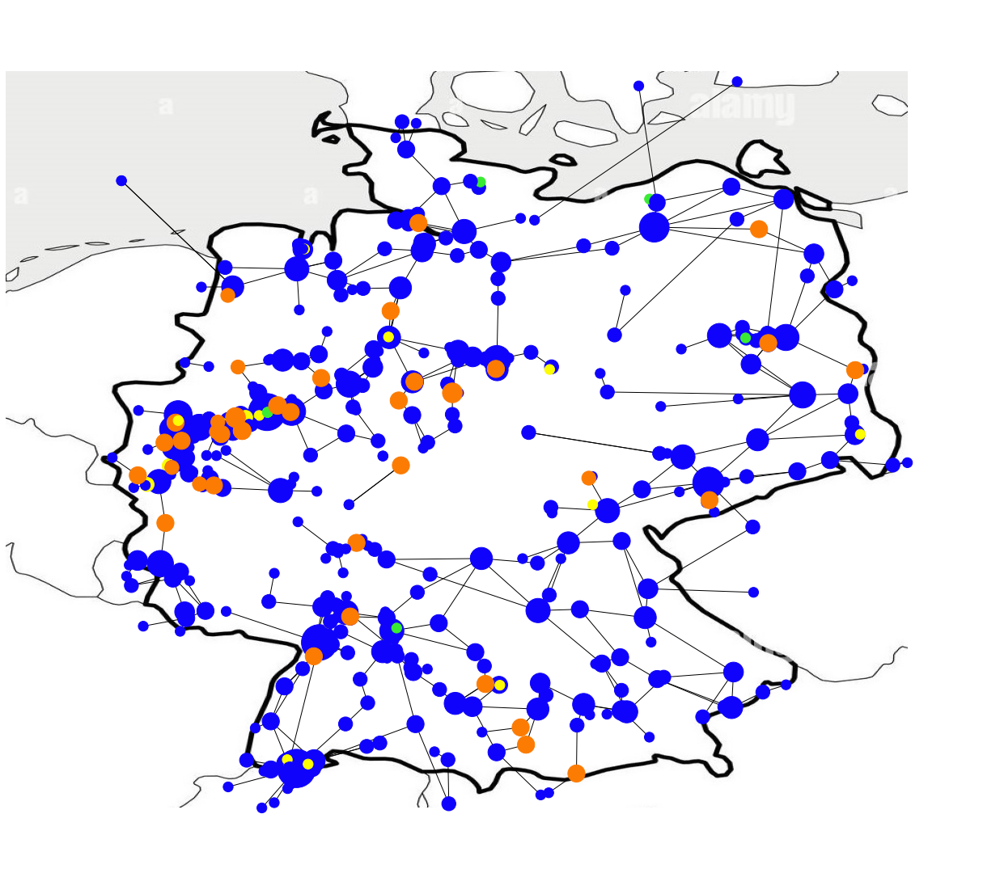

In [34]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 
a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
count = 0
for i in range(0,len(cables),1):
    
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)



In [35]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(attack_nodes)))+" out of 511")
print("\nPercentage Damage:"+str(100-(len(G.edges)*100/679)))


Number of Edges:554
Number of Nodes attacked:17 out of 511

Percentage Damage:18.409425625920477


Closeness Centrality

In [28]:
close_centrality=[]

close_centrality=list(nx.closeness_centrality(G).values())


In [29]:
min = input("Enter Minimum betweenness centrality: ")

Enter Minimum betweenness centrality: 0.115


In [30]:
min_close=[]

for i in range(0,len(close_centrality)):
    if(close_centrality[i]>float(min)):
        min_close.append(i)

attack_nodes=[]
for j in min_close:
    attack_nodes.append(v[j])

In [31]:
attack_nodes

[31.0,
 32.0,
 68.0,
 69.0,
 70.0,
 99.0,
 117.0,
 118.0,
 123.0,
 215.0,
 216.0,
 225.0,
 245.0,
 246.0,
 254.0,
 257.0,
 304.0,
 308.0,
 385.0,
 496.0]

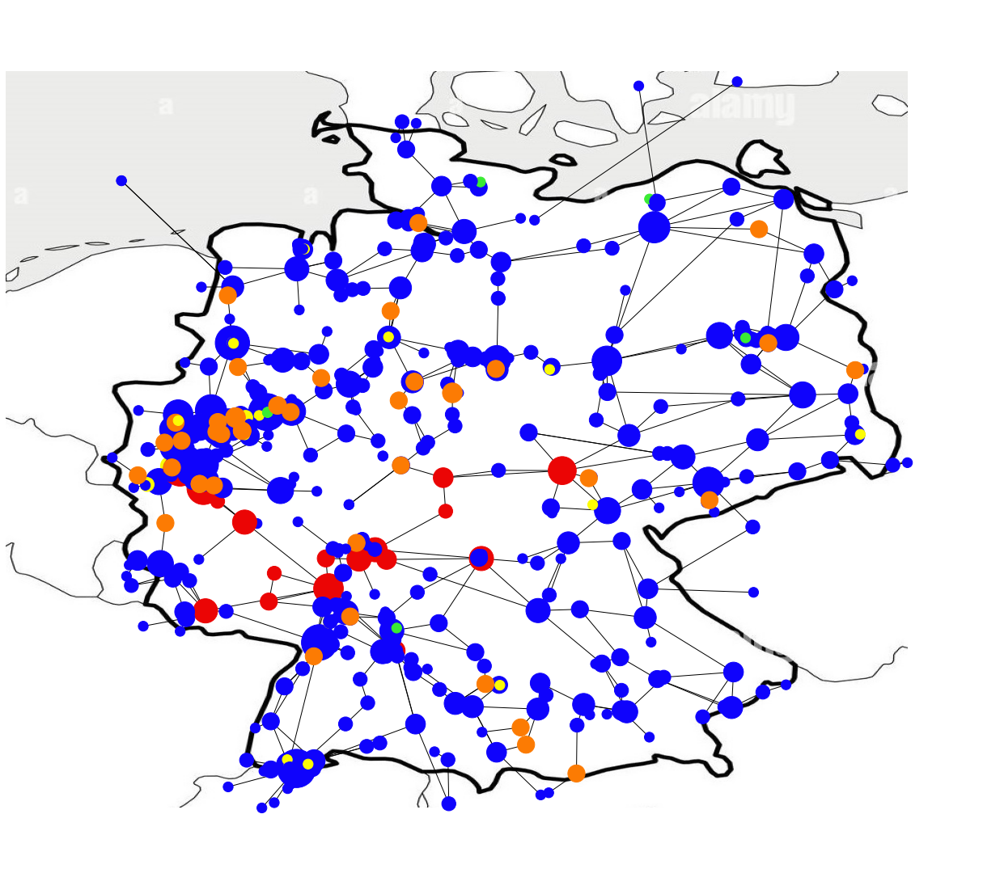

In [32]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)

#Highlighting the attack nodes

b=[]
for i in range(0,len(x)):
    for j in attack_nodes:
        if v[i]==j :
            b.append(i)

#identifying the affected links

a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

#adding nodes
G=nx.Graph()

for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    

pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []

#edge coloring for the links associated with the node that is being attacked
ecolor=color=["#eb34cf"]*len(p)
for i in range(0,len(cables),1):

    ecolor[i]="000000"
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i],color=ecolor[i])

    
for j in a:
    ecolor[j]="#eb0505"
    weight_edge.append(math.ceil(1+cables[j]+(0.2*wires[j])))
    G.add_edge(p[j],q[j],color=ecolor[j],weight=weight_edge[j])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
for j in b:
    color[j]="#eb0505"
  
#Red : Attacked nodes


plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)


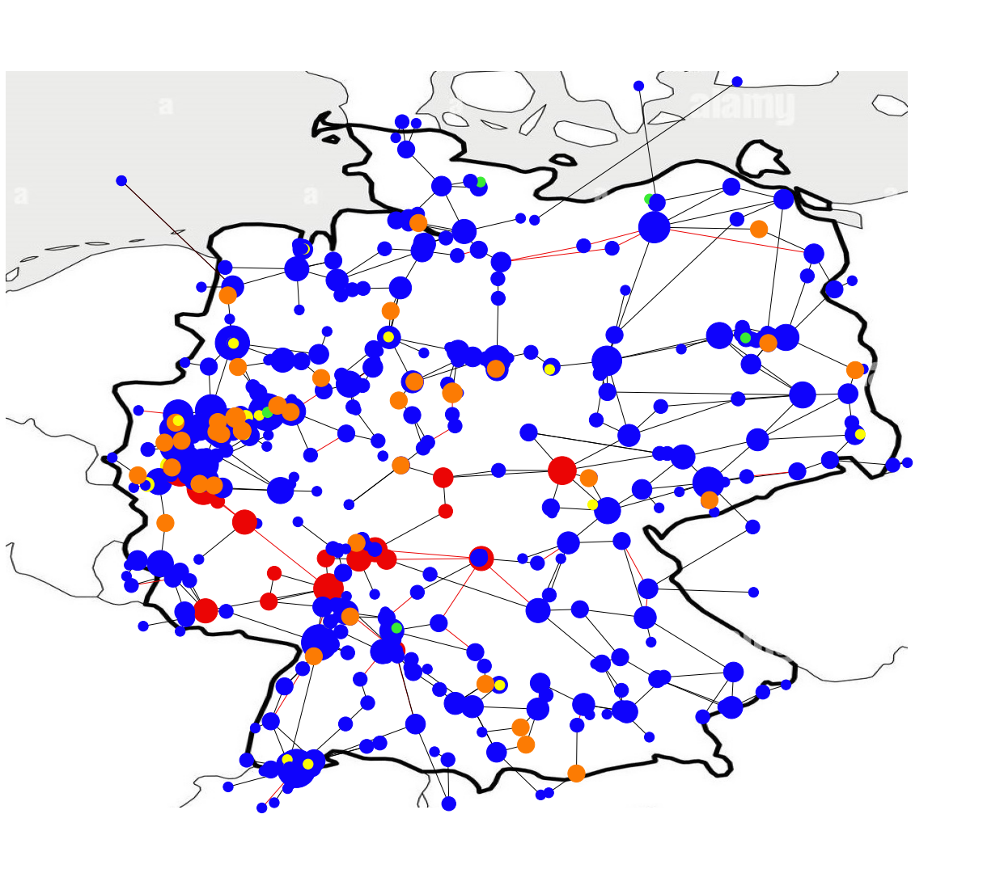

In [33]:
#Red links : affected network

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,edge_color=ecolor,node_size=nodesize)

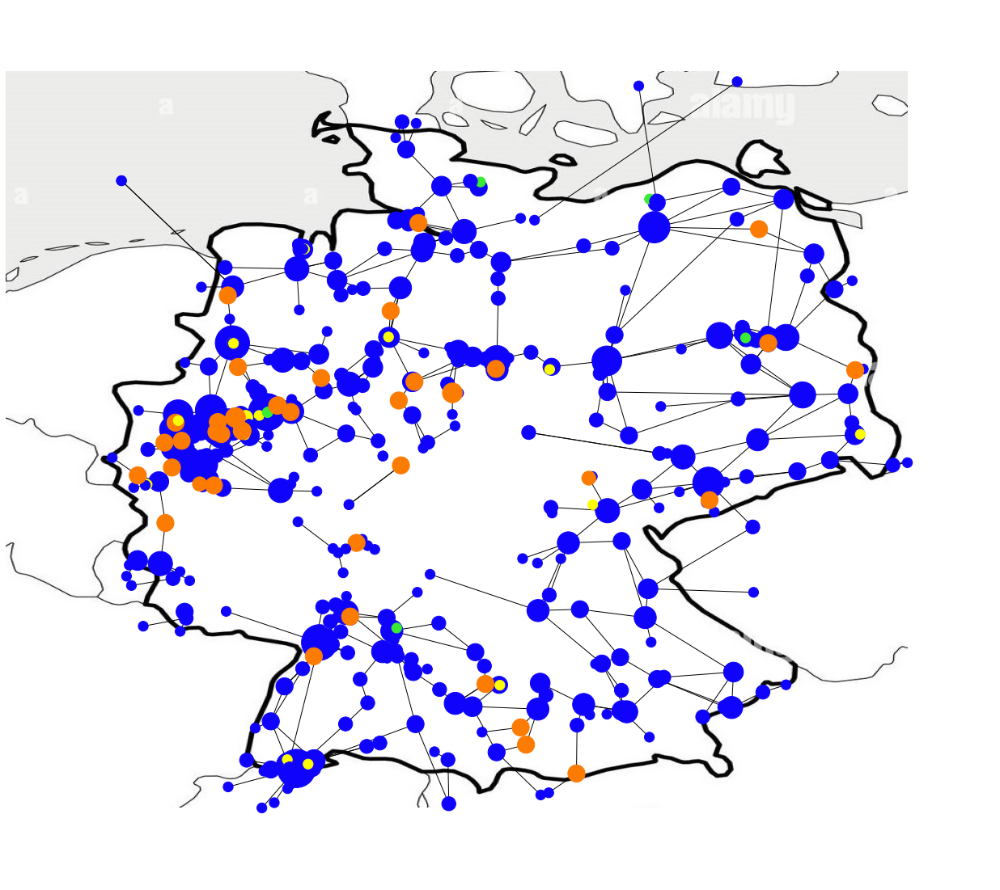

In [34]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 
a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
count = 0
for i in range(0,len(cables),1):
    
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)



In [35]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(attack_nodes)))+" out of 511")
print("\nPercentage Damage:"+str(100-(len(G.edges)*100/679)))


Number of Edges:583
Number of Nodes attacked:20 out of 511

Percentage Damage:14.138438880706929


Eigen vector centrality

In [28]:
ev_centrality=[]

ev_centrality=list(nx.eigenvector_centrality(G,max_iter=1000).values())


In [29]:
min = input("Enter Minimum betweenness centrality: ")

Enter Minimum betweenness centrality: 0.08


In [30]:
min_ev=[]

for i in range(0,len(ev_centrality)):
    if(ev_centrality[i]>float(min)):
        min_ev.append(i)

attack_nodes=[]
for j in min_ev:
    attack_nodes.append(v[j])

In [31]:
attack_nodes

[115.0,
 117.0,
 118.0,
 119.0,
 120.0,
 123.0,
 124.0,
 125.0,
 126.0,
 129.0,
 130.0,
 131.0,
 133.0,
 134.0,
 149.0,
 156.0,
 163.0,
 173.0,
 206.0,
 454.0,
 465.0,
 471.0,
 496.0]

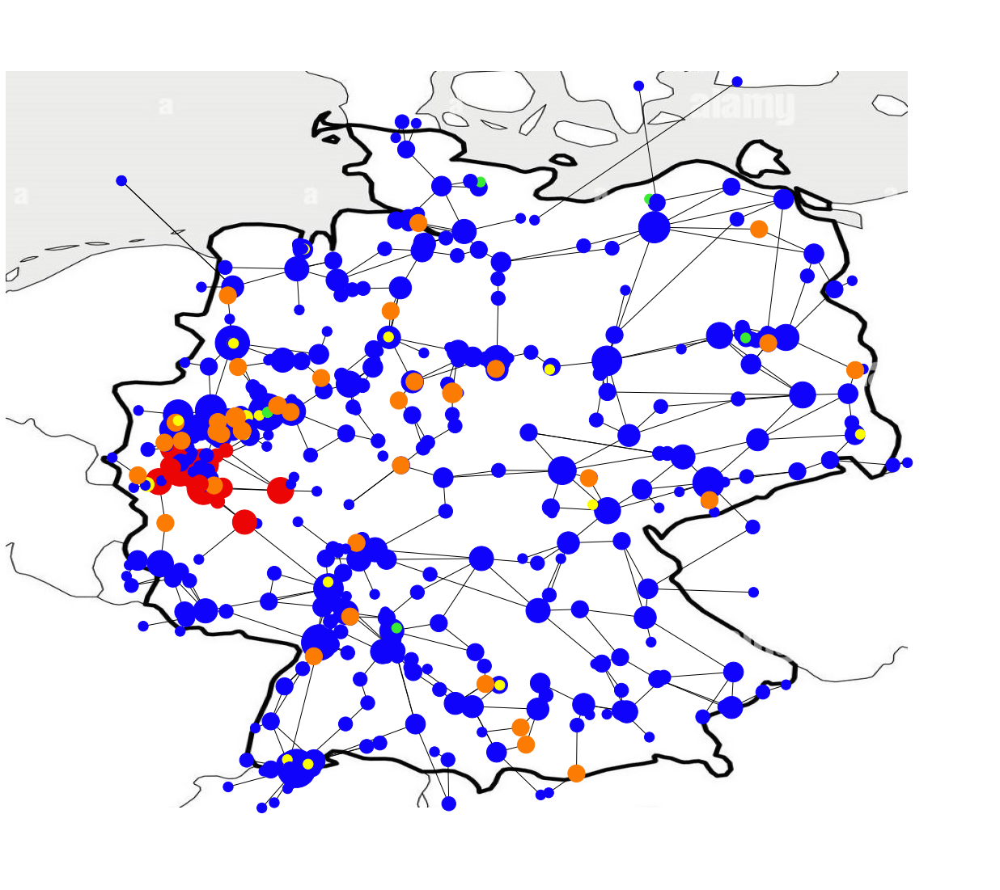

In [32]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)

#Highlighting the attack nodes

b=[]
for i in range(0,len(x)):
    for j in attack_nodes:
        if v[i]==j :
            b.append(i)

#identifying the affected links

a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

#adding nodes
G=nx.Graph()

for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    

pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []

#edge coloring for the links associated with the node that is being attacked
ecolor=color=["#eb34cf"]*len(p)
for i in range(0,len(cables),1):

    ecolor[i]="000000"
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i],color=ecolor[i])

    
for j in a:
    ecolor[j]="#eb0505"
    weight_edge.append(math.ceil(1+cables[j]+(0.2*wires[j])))
    G.add_edge(p[j],q[j],color=ecolor[j],weight=weight_edge[j])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
for j in b:
    color[j]="#eb0505"
  
#Red : Attacked nodes


plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)


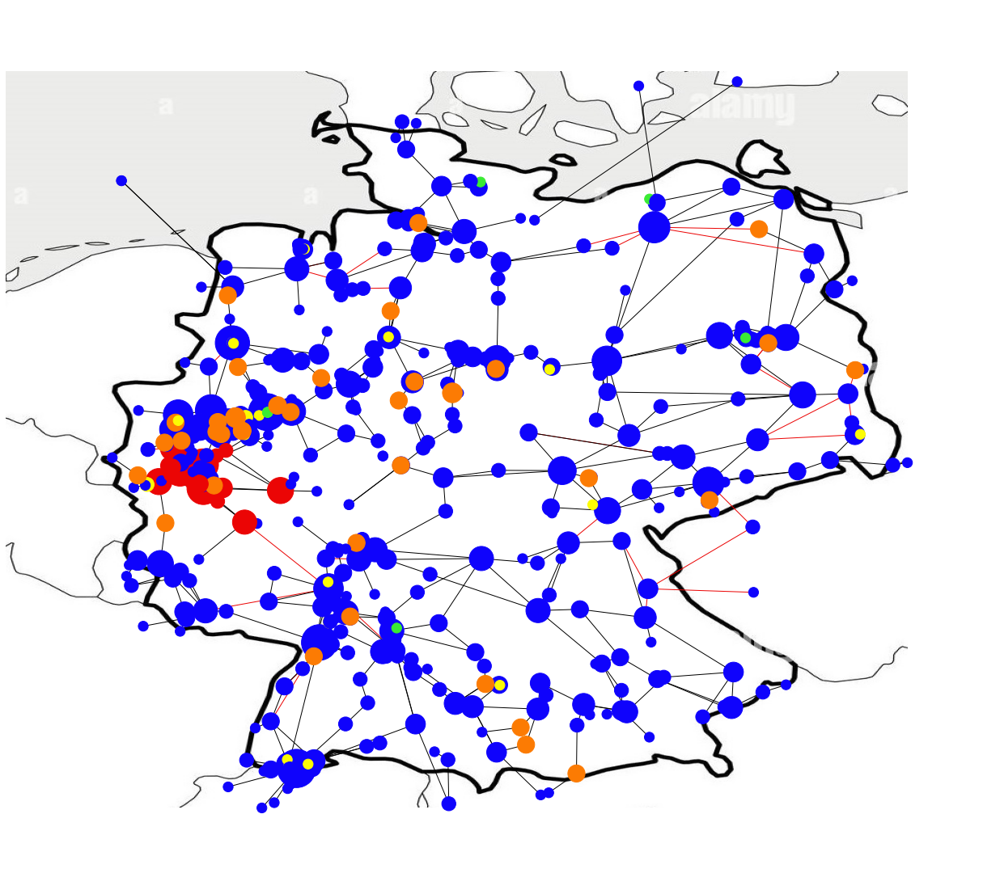

In [33]:
#Red links : affected network

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,edge_color=ecolor,node_size=nodesize)

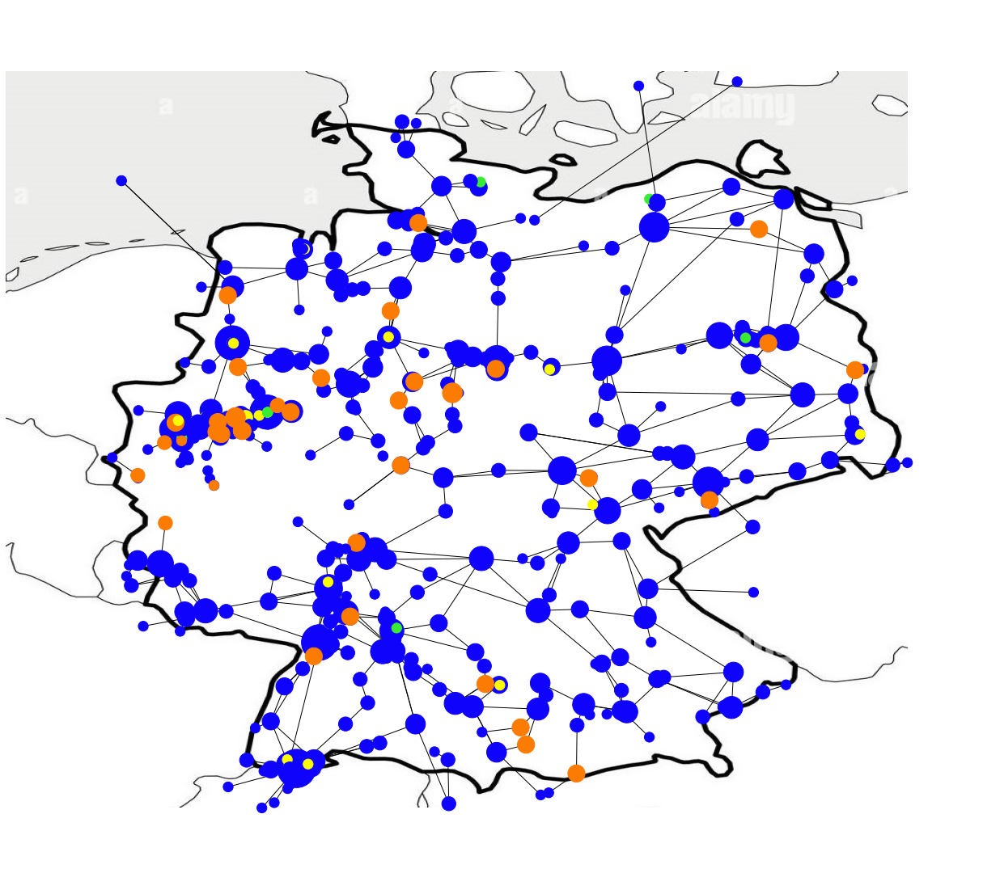

In [34]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 
a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
count = 0
for i in range(0,len(cables),1):
    
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)



In [35]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(attack_nodes)))+" out of 511")
print("\nPercentage Damage:"+str(100-(len(G.edges)*100/679)))


Number of Edges:581
Number of Nodes attacked:23 out of 511

Percentage Damage:14.432989690721655


2. Attacking the power stations:
    In the graph Powerstations are denoted by yellow blips and generators are denoted by green blips.
    These are the nodes which provides the substations with the electricity and hence the powergrid is created.
    In case of attack on a power station not only that single powerstation and it's links but also the adjacent 
    substations will be shut down due to powercut and there subsequent links will also be destroyed.
    
    Considering a possibility that a substation can be powered with 2 or more plants, we are making an assumption that only
    till the second closest substations will experience powercut. i.e on failure of a powerplant only the adjacent nodes and 
    adjacent nodes to those nodes will get turned off. Any next substation linked with that plant will be unaffected.
    
    This assumption is made by considering the number of total nodes(511) and number of powerplants(24). The substations
    are enough sparsely placed such that this cascading effect is effective till only 2 adjacent connections.
    Although it can be changed.

In [97]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 

In [98]:
#importing clean data

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
                
#types numbering
#substation=1, plant=2, generator=3, auxillary_t_node=4

In [99]:
power=[]
for i in range(0,len(x)):
    if(type[i]==2 or type[i]==3):
        power.append(int(v[i]))
        
print(power)

[50, 54, 82, 84, 91, 115, 121, 138, 142, 143, 166, 188, 202, 205, 206, 210, 217, 248, 249, 250, 251, 252, 257, 291, 293, 296, 310, 365, 368, 410, 423, 497, 507]


In [56]:
#Please enter node numbers

# Enter "x" to exit the loop
power_plant=[]

for i in range(0,len(power)):
    k=input("Enter number : ")
    
    if(k=='x' or k=='X'):
        break
    else:
        power_plant.append(int(k))

KeyboardInterrupt: Interrupted by user

In [100]:
power_plant

In [101]:
#power_plant=[49, 53, 81, 83, 90, 114, 120]
                        
a = []
a1=[]
final=[]
for i in range(0,len(p)):
    for j in power_plant:
        if(p[i]==j):
            a.append(q[i])
        elif q[i]==j:
            a.append(p[i])


for i1 in range(0,len(p)):
    for k in a:
        if(p[i]==k):
            a1.append(q[i])
        elif(q[i]==k):
            a1.append(p[i])

In [102]:
penultimate = list(set(power_plant) | set(a))

attack_nodes = list(set(penultimate) | set(a1))

In [103]:
a1=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a1.append(i)
        elif q[i] == j:
            a1.append(i)
a=[*set(a1)]

In [104]:
for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

In [105]:
#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(v),1):
    G.add_node(v[i],pos=(x[i],y[i]))

pos=nx.get_node_attributes(G,'pos')


In [106]:
#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
count = 0
for i in range(0,len(cables),1):

    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])



In [107]:
degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

In [108]:
#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

In [109]:
len(G.edges())

506

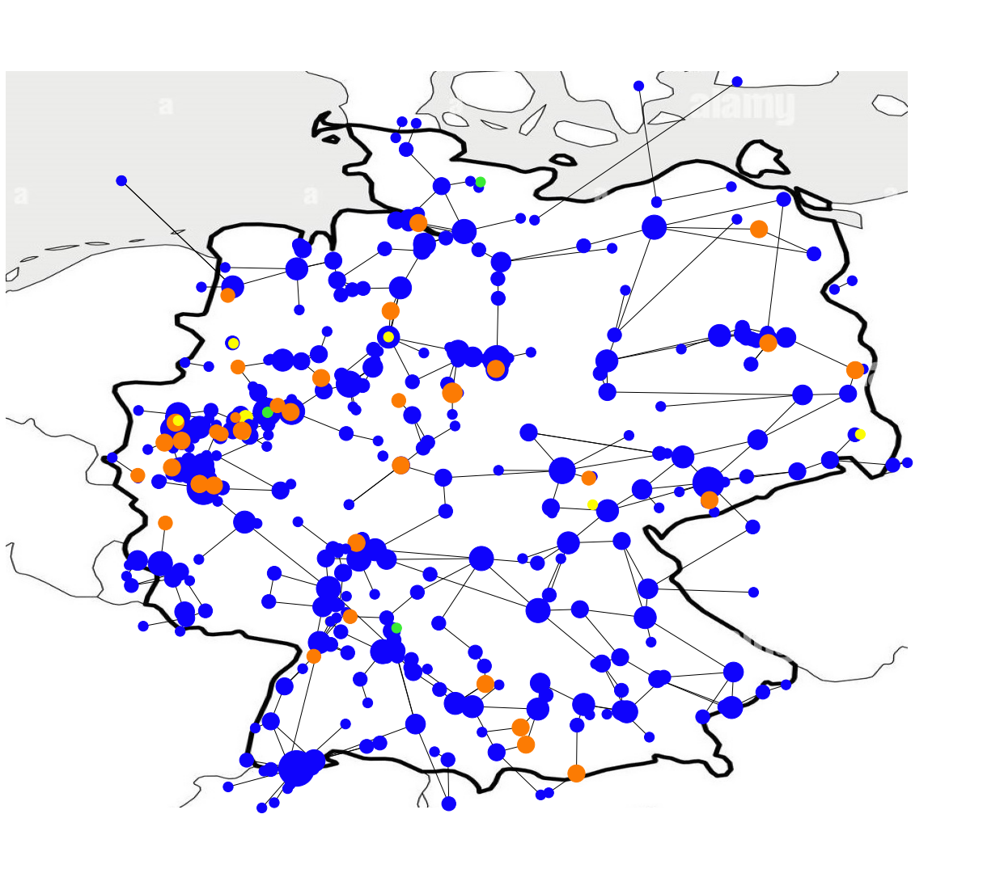

In [110]:
plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize,with_labels=False)

In [111]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(power_plant)))+" out of 511")
print("\nPercentage Damage:"+str(100-(len(G.edges)*100/679)))

Number of Edges:506
Number of Nodes attacked:33 out of 511

Percentage Damage:25.478645066273927


3. Attacking a particular link:
    In case of a small scale pointed attack, disconnecting a particular link, particularly a link from Powerplant to 
    next network.
    Which can lead to cascading failure of next substations in line.
    

In [107]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 

In [108]:
attack_nodes=[354,162]

#attack_nodes.append(p.index(int(input("Enter the first node : "))))
#attack_nodes.append(p.index(int(input("Enter the second node : "))))


In [109]:
#Highlighting the nodes

b=[]
for i in range(0,len(x)):
    for j in attack_nodes:
        if v[i]==j :
            b.append(i)

In [110]:
b

[159, 346]

In [111]:
#identifying the affected links

a=[]
for i in range(0,len(p)):

    if (p[i] == attack_nodes[0] and q[i] == attack_nodes[1]):
        a.append(i)
    elif (q[i] == attack_nodes[0] and p[i] == attack_nodes[1]):
        a.append(i)


In [112]:
#adding nodes
G=nx.Graph()

for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    

pos=nx.get_node_attributes(G,'pos')


In [113]:
#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []

#edge coloring for the links associated with the node that is being attacked
ecolor=color=["#eb34cf"]*len(p)
for i in range(0,len(cables),1):

    ecolor[i]="000000"
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i],color=ecolor[i])

    
for j in a:
    ecolor[j]="#FF0000"
    weight_edge.append(math.ceil(1+cables[j]+(0.2*wires[j])))
    G.add_edge(p[j],q[j],color=ecolor[j],weight=weight_edge[j])



In [114]:
degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

In [115]:
#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
for j in b:
    color[j]="#eb0505"
  


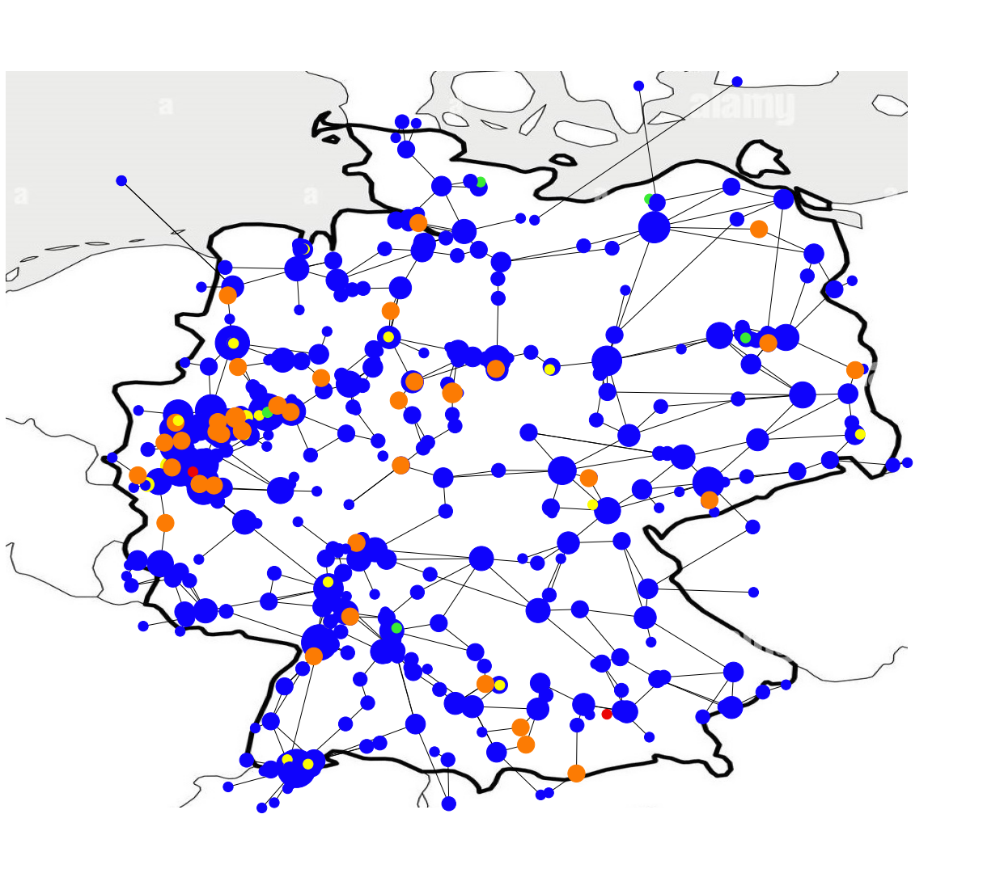

In [116]:
#Red : Corresponding nodes


plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)



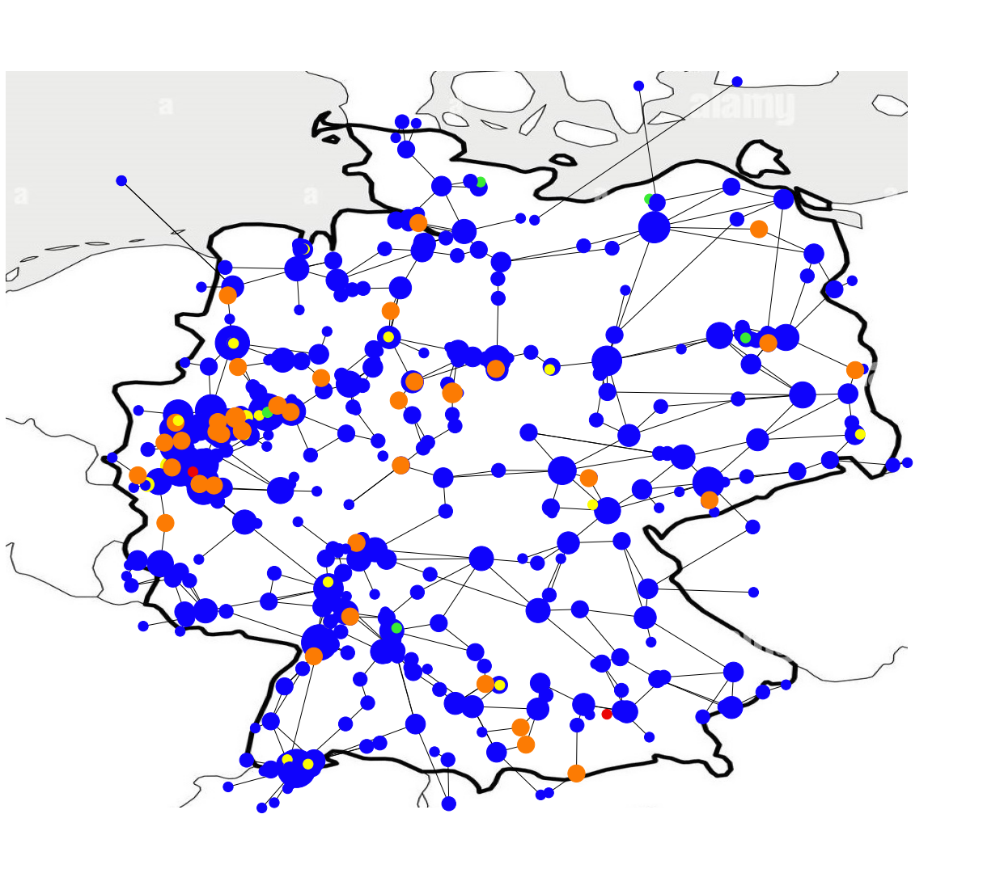

In [117]:
#Red links : affected link

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,edge_color=ecolor,node_size=nodesize)


    
We can carryout this type of attack with the help of the concept of weight of the edge.
    
    If the weight of a link is decresed to half than the earlier, it means the same electric power now have to pass 
    through half the wires

In [118]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 

In [119]:
a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)


In [120]:
for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

In [121]:
a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)


In [122]:
for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

In [123]:
#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')


In [124]:
#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
count = 0
for i in range(0,len(cables),1):
    
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])


In [125]:
degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

In [126]:
#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

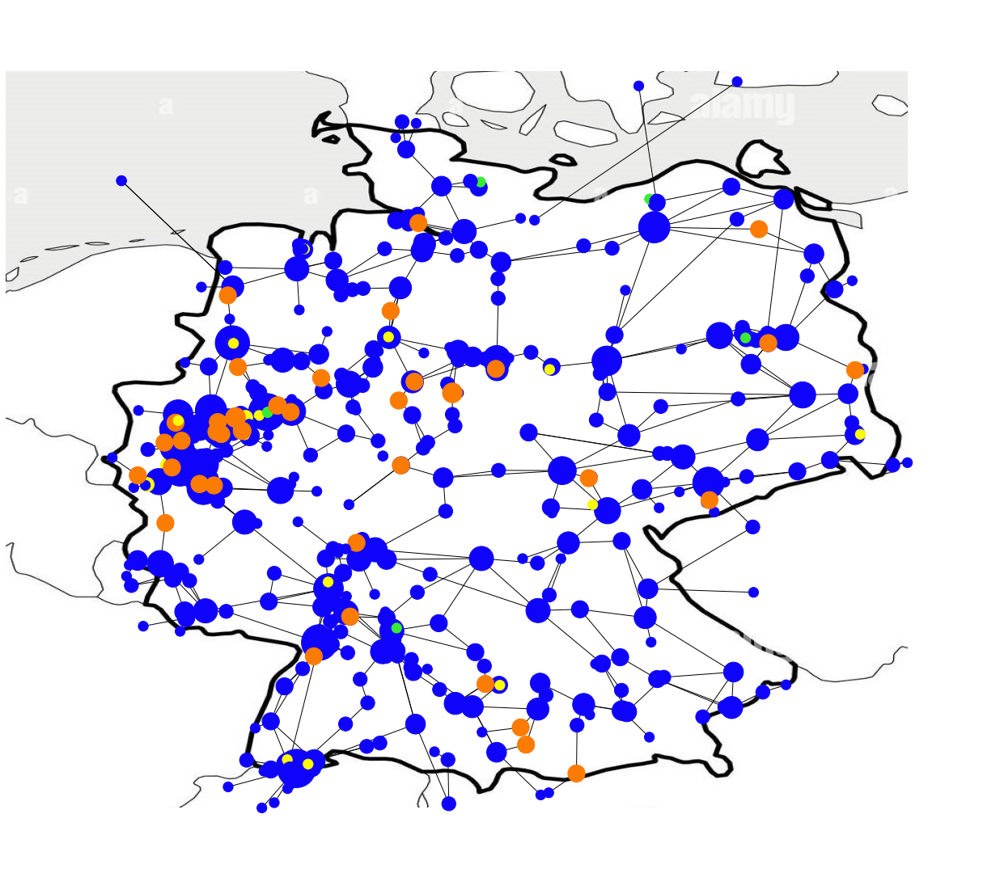

In [127]:
plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)

In [128]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(attack_nodes)))+" out of 511")
print("\nPercentage Damage:"+str(100-(len(G.edges)*100/679)))

Number of Edges:677
Number of Nodes attacked:2 out of 511

Percentage Damage:0.2945508100147265


 Combined_attack

we'll be taking top 10 of all the above 4 (degree centrality, closeness centraloty, betweenness centrality and power_plant)
and take intersection of it and do the exercise

In [32]:
number=input("Enter total number of top to choose:")

Enter total number of top to choose:2


In [33]:
top_n_btw=[]

btw_centrality=[]
btw_centrality=list(nx.betweenness_centrality(G).values())
btw_centrality.sort(reverse=True)

for i in btw_centrality[0:int(number)]:
    top_n_btw.append(list(nx.betweenness_centrality(G).values()).index(i))

In [34]:
top_n_btw

[68, 116]

In [57]:
top_n_close=[]

close_centrality=[]
close_centrality=list(nx.closeness_centrality(G).values())
close_centrality.sort(reverse=True)

for i in close_centrality[0:int(number)]:
    top_n_close.append(list(nx.closeness_centrality(G).values()).index(i))

In [58]:
top_n_close

[212, 68]

In [59]:
top_n_ev=[]

ev_centrality=[]
ev_centrality=list(nx.eigenvector_centrality(G,max_iter=1000).values())
ev_centrality.sort(reverse=True)

for i in ev_centrality[0:int(number)]:
    top_n_ev.append(list(nx.eigenvector_centrality(G,max_iter=1000).values()).index(i))

In [60]:
top_n_ev

[116, 122]

In [61]:
top_n_degs=[]

degs_centrality=[]
degs_centrality=list(nx.degree_centrality(G).values())
degs_centrality.sort(reverse=True)

for i in degs_centrality[0:int(number)]:
    top_n_degs.append(list(nx.degree_centrality(G).values()).index(i))

In [62]:
top_n_degs

[354, 162]

In [52]:
c= sorted(list(set(top_n_degs)) + list(set(top_n_ev)) + list(set(top_n_btw)) + list(set(top_n_close)))
attack_nodes = [*set(c)]
attack_nodes

[162, 67, 68, 132, 354, 483, 298, 241, 51, 116, 85, 119, 122, 124]

In [72]:
list(set(top_n_close) & set(top_n_degs) & set(top_n_btw))

[116]

In [73]:
list(set(top_n_close) & set(top_n_ev) & set(top_n_btw))

[124, 122, 483, 116]

In [74]:
list(set(top_n_degs) & set(top_n_ev) & set(top_n_btw))

[116]

In [75]:
list(set(top_n_degs) & set(top_n_btw))

[116, 41, 36, 85]

In [53]:
attack_nodes

[162, 67, 68, 132, 354, 483, 298, 241, 51, 116, 85, 119, 122, 124]

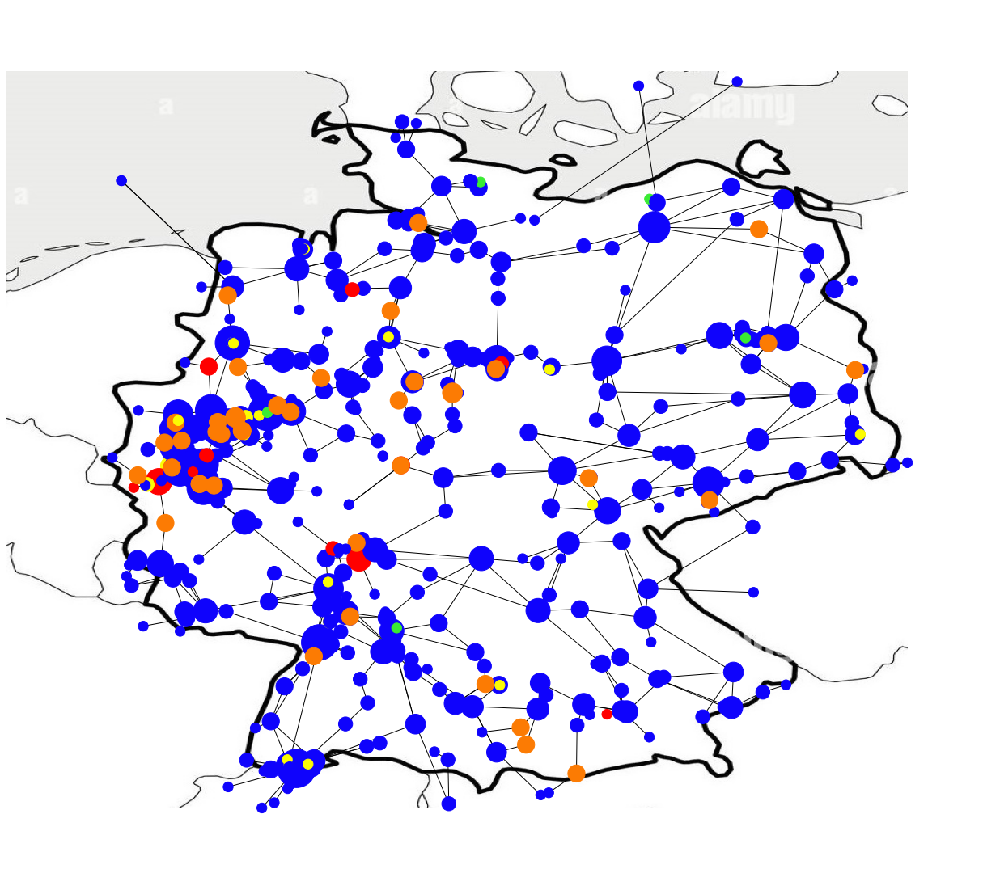

In [54]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)

#Highlighting the attack nodes

b=[]
for i in range(0,len(x)):
    for j in attack_nodes:
        if v[i]==j :
            b.append(i)

#identifying the affected links

a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

#adding nodes
G=nx.Graph()

for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    

pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []

#edge coloring for the links associated with the node that is being attacked
ecolor=color=["#eb34cf"]*len(p)
for i in range(0,len(cables),1):

    ecolor[i]="000000"
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i],color=ecolor[i])

    
for j in a:
    ecolor[j]="#eb0505"
    weight_edge.append(math.ceil(1+cables[j]+(0.2*wires[j])))
    G.add_edge(p[j],q[j],color=ecolor[j],weight=weight_edge[j])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(x)
for i in range(0,len(x),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"
        
for j in b:
    color[j]="#ff0000"
  
#Red : Attacked nodes


plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)


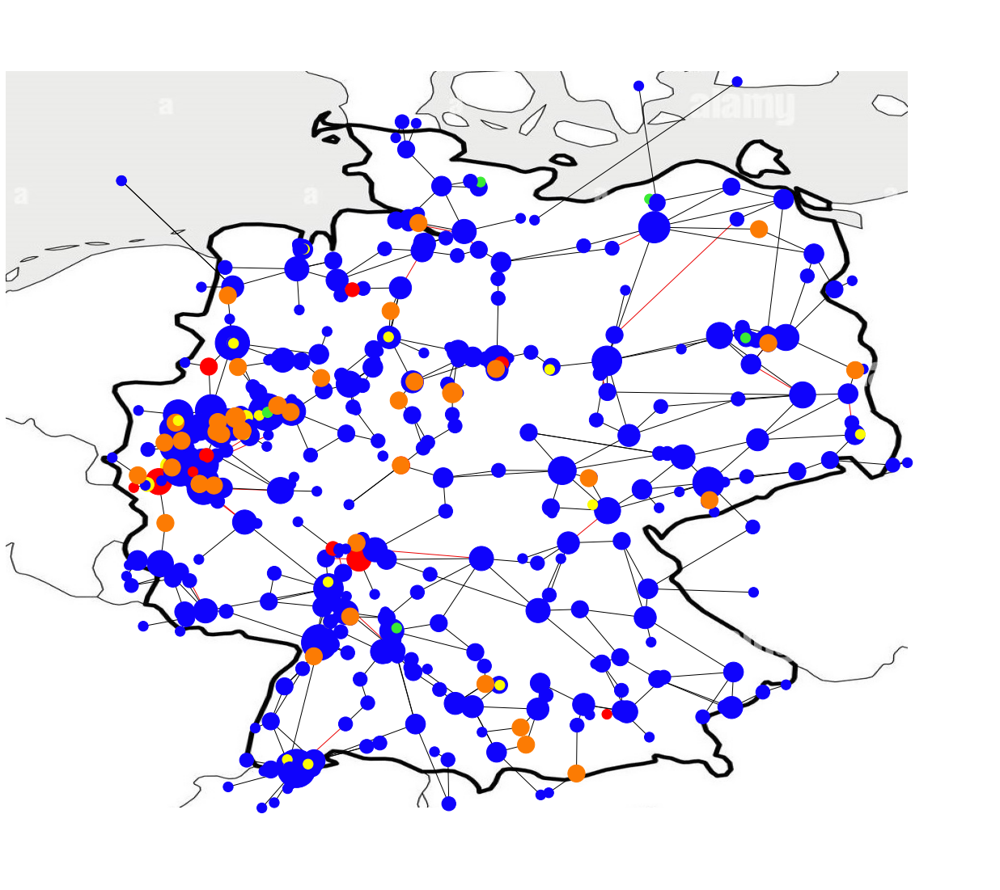

In [56]:
#Red links : affected network

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,edge_color=ecolor,node_size=nodesize)

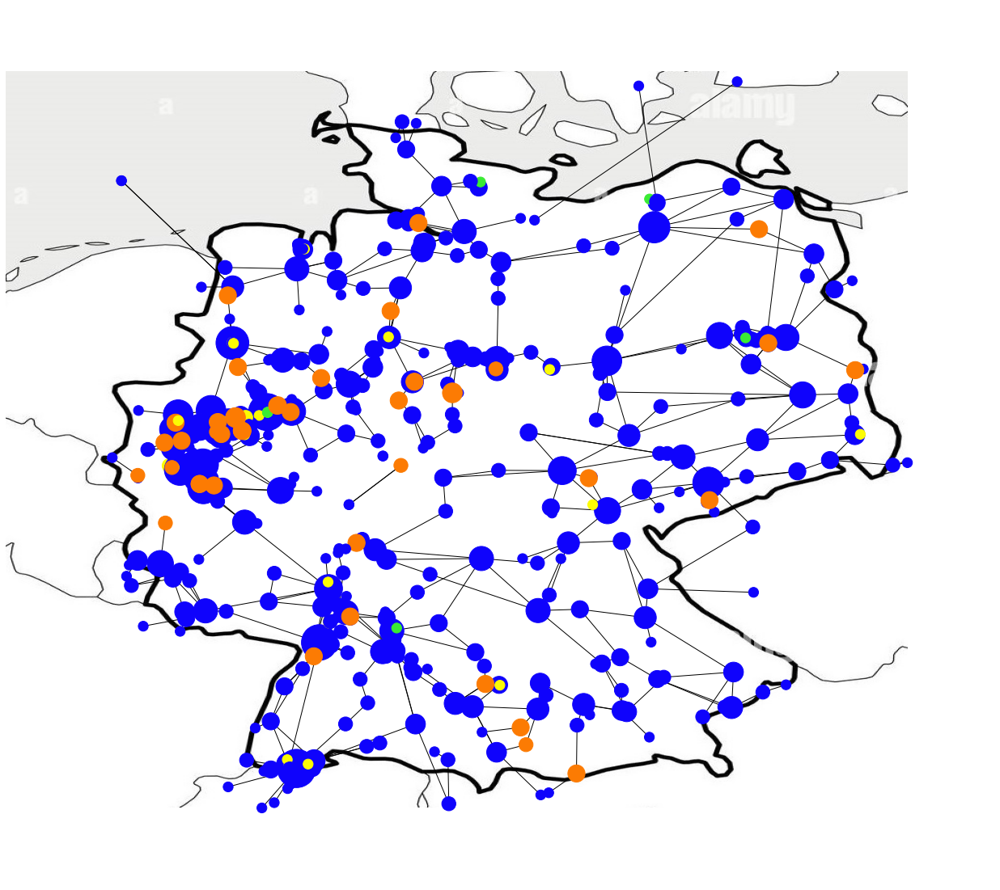

In [57]:
# flushing the arrays and importing fresh unhandled data again
v=[]
x=[]
y=[]
type=[]
p=[]
q=[]
cables=[]
wires=[]
pos=[]
color=[]

v,x,y,type = np.loadtxt('nodes.txt', unpack=True)
p,q,cables,wires = np.loadtxt('weight.txt', unpack=True)
 
a=[]
for i in range(0,len(p)):
    for j in attack_nodes:
        if p[i] == j:
            a.append(i)
        elif q[i] == j:
            a.append(i)

for i in a:
    p=np.delete(p,i-a.index(i))
    q=np.delete(q,i-a.index(i))
    cables=np.delete(cables,i-a.index(i))
    wires=np.delete(wires,i-a.index(i))

#adding nodes
G=nx.Graph()
count=0        
for i in range(0,len(x),1):

    G.add_node(v[i],pos=(x[i],y[i]))
    
pos=nx.get_node_attributes(G,'pos')

#adding links with weights (weight assumptions, cables=1 ,wires=0.2)
weight_edge = []
count = 0
for i in range(0,len(cables),1):
    
    weight_edge.append(math.ceil(1+cables[i]+(0.2*wires[i])))
    G.add_edge(p[i],q[i],weight=weight_edge[i])

degs=[]
nodesize=[]
for i,deg in nx.degree(G):
    degs.append(deg)
    nodesize.append(150*deg)

#color coding using station type as reference
#substation ==> blue
#plant ==> yellow
#generator ==> green
#auillarynode ==> orange
color=["#0f03fc"]*len(v)
for i in range(0,len(v),1):        
    if (type[i]==1):
        color[i]="#0f03fc"
    elif(type[i]==2):
        color[i]="#fcfc03"
    elif(type[i]==3):
        color[i]="#3aeb34"
    else:
        color[i]="#fc7b03"

plt.rcParams["figure.figsize"] = (70,20)
img = plt.imread("1.jpg")
fig, ax = plt.subplots()
ax.imshow(img, extent=[4.687555, 15.11496564,47.09422083,55.610345])


nx.draw(G,pos,node_color=color,node_size=nodesize)



In [58]:
print("Number of Edges:"+str(int(len(G.edges()))))
print("Number of Nodes attacked:"+str(int(len(attack_nodes)))+" out of 511")
print("\nPercentage Damage:"+str(100-(len(G.edges)*100/679)))

Number of Edges:642
Number of Nodes attacked:14 out of 511

Percentage Damage:5.449189985272454
